<a href="https://colab.research.google.com/github/poojasambhwani/multimodal-rag/blob/main/multimodal_rag.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

Thu Sep 24 15:37:36 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   48C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import os
from google.colab import userdata

os.environ["OPENAI_API_KEY"] = userdata.get("OPENAI_API_KEY")
print("OPENAI_API_KEY set:", bool(os.environ["OPENAI_API_KEY"]))

OPENAI_API_KEY set: True


In [ ]:
REPO = "/content/multimodal-rag"
if os.path.exists(REPO):
    !git -C {REPO} pull -q
else:
    !git clone -q https://github.com/poojasambhwani/multimodal-rag.git {REPO}

In [ ]:
import pandas as pd

data = pd.read_csv(f"{REPO}/corpus.csv")
data[["id", "title", "speakers"]]

,id,title,speakers
0,CB7MBQ,Implementing Block-Max Pruning in Rust: Faster...,Ferdinand Schlatt; Antonio Mallia
1,NHNPMY,Deriving Maximum Insight: Open-Source Graph-En...,Mykyta Kemarskyi
2,YPJWFM,OpenSearch v3: A New Era of Search Innovation ...,Dotan Horovits; Aswath Srinivasan
3,3AWMQZ,Multi-Vector embeddings revolution? or evolution?,Marcin Antas; Roberto Esposito
4,ZVGHWC,Multi-Stage Retrieval in Elasticsearch - Prese...,Carlos Delgado
5,PD8WGF,From Infrastructure to Production: A Year of S...,Mateusz Charytoniuk; Gosia Zagajewska; Luiz Mi...
6,B39JSW,"One GPU, Many Models: What Works and What Segf...",Yash Panchal
7,S7RELZ,Ducks to the rescue - ETL using Python and DuckDB,Marc-André Lemburg


In [ ]:
from pathlib import Path
import urllib.request

DATA = Path("/content/data")
DATA.mkdir(exist_ok=True)

talk = data.set_index("id").loc["PD8WGF"]
video = DATA / "PD8WGF.mp4"
slides = DATA / "PD8WGF.pdf"

for url, dest in [(talk.video_url, video), (talk.slides_url, slides)]:
    if not dest.exists():
        tmp = dest.with_suffix(".part")
        urllib.request.urlretrieve(url, tmp)
        tmp.replace(dest)
    print(f"{dest.name}: {dest.stat().st_size / 2**20:.0f} MB")

PD8WGF.mp4: 420 MB
PD8WGF.pdf: 3 MB


In [ ]:
!pip install -q pixeltable==0.7.9 openai-whisper

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 803.2/803.2 kB 24.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.9/11.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 125.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 215.5/215.5 kB 20.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 118.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.9 MB/s eta 0:00:00

In [ ]:
import pixeltable as pxt
from pixeltable.functions import whisper
from pixeltable.functions.audio import audio_splitter

pxt.create_dir("mmrag", if_exists="ignore")

talks = pxt.create_table(
    "mmrag.talks",
    {"talk_id": pxt.String, "title": pxt.String, "video": pxt.Video},
    primary_key="talk_id",
    if_exists="ignore",
)
talks.add_computed_column(audio=talks.video.extract_audio(format="flac"), if_exists="ignore")

chunks = pxt.create_view(
    "mmrag.audio_chunks",
    talks,
    iterator=audio_splitter(talks.audio, duration=30.0, min_silence_len=0.5),
    if_exists="ignore",
)
chunks.add_computed_column(asr=whisper.transcribe(chunks.audio_segment, model="small.en"), if_exists="ignore")
chunks.add_computed_column(text=chunks.asr.text.astype(pxt.String), if_exists="ignore")

Creating a Pixeltable instance at: /root/.pixeltable
Connected to Pixeltable database at: postgresql+psycopg://postgres:***@/pixeltable?host=%2Froot%2F.pixeltable%2Fpgdata
Created directory 'mmrag'.
Created table 'talks'.
Added 0 column values with 0 errors in 0.01 s
Created view 'mmrag/audio_chunks'.
Added 0 column values with 0 errors in 0.01 s
Added 0 column values with 0 errors in 0.01 s


No rows affected.

In [ ]:
if talks.where(talks.talk_id == "PD8WGF").count() == 0:
    talks.insert([{"talk_id": "PD8WGF", "title": talk["title"], "video": str(video)}])

100%|████████████████████████████████████████| 461M/461M [00:02<00:00, 202MiB/s]


Inserted 46 rows with 0 errors in 132.23 s (0.35 rows/s)


In [ ]:
rows = (chunks.where(chunks.talk_id == "PD8WGF")
        .order_by(chunks.segment_start)
        .select(chunks.segment_start, chunks.segment_end, chunks.text)
        .collect().to_pandas())
rows["dur"] = rows.segment_end - rows.segment_start
print(len(rows), "chunks | seconds per chunk:", rows.dur.describe()[["min", "mean", "max"]].round(1).to_dict())
rows.head(8)

45 chunks | seconds per chunk: {'min': 13.2, 'mean': 25.5, 'max': 30.0}


,segment_start,segment_end,text,dur
0,0.000,29.856,"So, the next talk is from guys from Peddler. ...",29.856
1,29.856,53.952,Hello. Nice. We are extremely happy to be her...,24.096
2,53.952,77.856,And now we wanted to talk about what worked f...,23.904
3,77.856,100.224,And one of them is doing hobby projects or ex...,22.368
4,100.224,128.256,"With Padler, we wanted to create a tool that ...",28.032
5,128.256,153.408,businesses we approached would rather use som...,25.152
6,153.408,183.264,So Peddler is our open source software that a...,29.856
7,183.264,212.832,or even on the cloud if you really want to. A...,29.568


In [ ]:
for _, r in rows.sample(3, random_state=0).iterrows():
    m, s = divmod(int(r.segment_start), 60)
    print(f"[{m}:{s:02d}] {talk['video_url']}#t={int(r.segment_start)}\n   {r.text[:150]}\n")

[12:40] https://video.fosdem.org/2026/ud2120/PD8WGF-from_infrastructure_to_production_a_year_of_self-hosted_llms.mp4#t=760
    and talk about a few projects that we are building on top of Paddler and that we hope represented this experimental frontier of using LLMs. And my ho

[15:40] https://video.fosdem.org/2026/ud2120/PD8WGF-from_infrastructure_to_production_a_year_of_self-hosted_llms.mp4#t=940
    And we came across the project called FireSparkle, and this is a research project, and its goal is to take the user input and translate it into spark

[11:30] https://video.fosdem.org/2026/ud2120/PD8WGF-from_infrastructure_to_production_a_year_of_self-hosted_llms.mp4#t=690
    However, the cost efficiency gets much more immediate when we start to use some specialized smaller models. And also, with self-hosted approach, we g



t = 30s


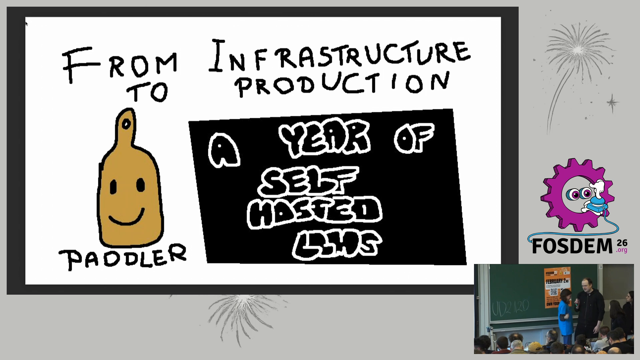

t = 300s


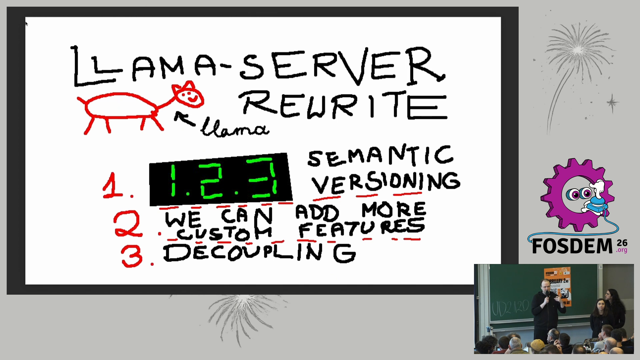

t = 690s


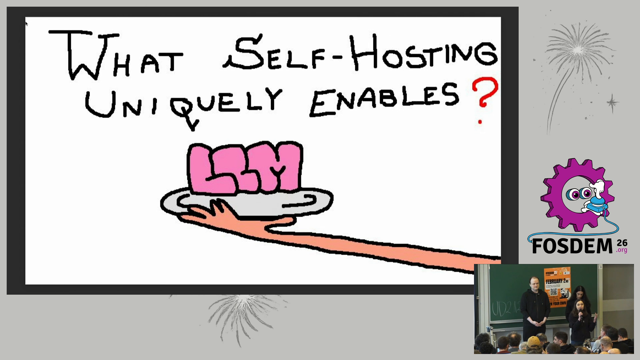

t = 940s


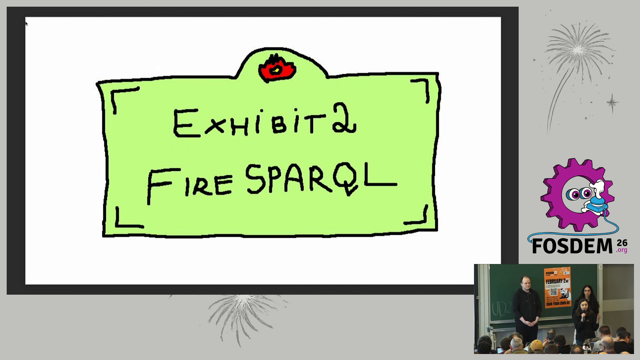

In [ ]:
from IPython.display import display

one_talk = talks.where(talks.talk_id == "PD8WGF")
for t in [30, 300, 690, 940]:
    img = one_talk.select(f=talks.video.extract_frame(timestamp=t)).collect()[0]["f"]
    print(f"t = {t}s")
    img.thumbnail((640, 360))
    display(img)

In [ ]:
!pip install -q scenedetect

scenes = one_talk.select(s=talks.video.scene_detect_content(fps=2, min_scene_len=4)).collect()[0]["s"]
print(len(scenes), "scenes detected vs 22 slides")
for sc in scenes[:12]:
    m, s = divmod(int(sc["start_time"]), 60)
    print(f"  {m}:{s:02d}  lasts {sc['duration']:.0f}s")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.2/146.2 kB 8.3 MB/s eta 0:00:00


/usr/local/lib/python3.13/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: SyntaxWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
/usr/local/lib/python3.13/dist-packages/moviepy/video/io/ffmpeg_reader.py:367: SyntaxWarning: invalid escape sequence '\d'
  rotation_lines = [l for l in lines if 'rotate          :' in l and re.search('\d+$', l)]
/usr/local/lib/python3.13/dist-packages/moviepy/video/io/ffmpeg_reader.py:370: SyntaxWarning: invalid escape sequence '\d'
  match = re.search('\d+$', rotation_line)
/usr/local/lib/python3.13/dist-packages/moviepy/config_defaults.py:47: SyntaxWarning: invalid escape sequence '\P'
  IMAGEMAGICK_BINARY = r"C:\Program Files\ImageMagick-6.8.8-Q16\magick.exe"


11 scenes detected vs 22 slides
  0:00  lasts 5s
  0:05  lasts 207s
  3:32  lasts 1s
  3:33  lasts 4s
  3:37  lasts 47s
  4:24  lasts 122s
  6:26  lasts 216s
  10:02  lasts 238s
  14:00  lasts 139s
  16:19  lasts 119s
  18:17  lasts 46s


In [ ]:
import time, statistics

configs = {
    "content t=27 (baseline)": talks.video.scene_detect_content(fps=2, min_scene_len=4),
    "content t=15 + edges":    talks.video.scene_detect_content(fps=2, min_scene_len=4, threshold=15.0, delta_edges=1.0),
    "adaptive":                talks.video.scene_detect_adaptive(fps=2, min_scene_len=4, min_content_val=5.0),
    "hash t=0.395 (default)":  talks.video.scene_detect_hash(fps=2, min_scene_len=4),
    "hash t=0.25":             talks.video.scene_detect_hash(fps=2, min_scene_len=4, threshold=0.25),
}
results = {}
for name, expr in configs.items():
    t0 = time.time()
    results[name] = one_talk.select(s=expr).collect()[0]["s"]
    durs = [sc["duration"] for sc in results[name]]
    print(f"{name:25s} {len(durs):3d} scenes | median {statistics.median(durs):4.0f}s | "
          f"longest {max(durs):4.0f}s | took {time.time() - t0:3.0f}s")

content t=27 (baseline)    11 scenes | median  119s | longest  238s | took 301s
content t=15 + edges       30 scenes | median   34s | longest  101s | took 334s
adaptive                   22 scenes | median   49s | longest  142s | took 262s
hash t=0.395 (default)      5 scenes | median  143s | longest  505s | took 225s
hash t=0.25                19 scenes | median   51s | longest  188s | took 223s


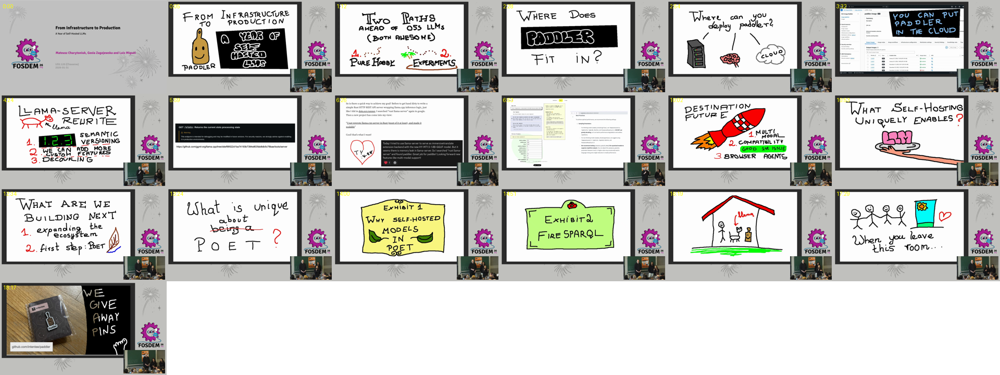

In [ ]:
from PIL import Image, ImageDraw

def contact_sheet(scenes, cols=6, w=320):
    thumbs = []
    for sc in scenes:
        img = one_talk.select(f=talks.video.extract_frame(timestamp=sc["start_time"] + sc["duration"] / 2)).collect()[0]["f"]
        img.thumbnail((w, w))
        m, s = divmod(int(sc["start_time"]), 60)
        ImageDraw.Draw(img).text((6, 6), f"{m}:{s:02d}", fill="yellow")
        thumbs.append(img)
    h = thumbs[0].height
    sheet = Image.new("RGB", (cols * w, -(-len(thumbs) // cols) * h), "white")
    for i, im in enumerate(thumbs):
        sheet.paste(im, ((i % cols) * w, (i // cols) * h))
    return sheet

pick = "hash t=0.25"   # change this to the setting that looked best in Cell 13
contact_sheet(results[pick])

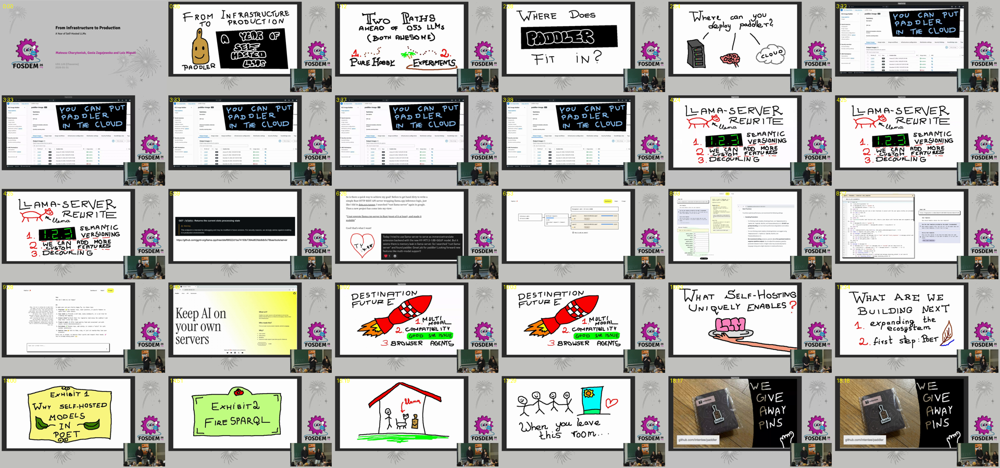

In [ ]:
contact_sheet(results["content t=15 + edges"])

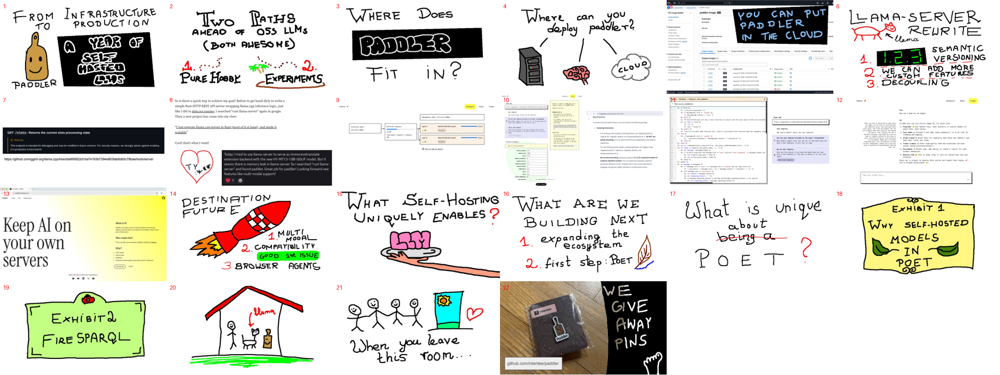

In [ ]:
import pypdfium2 as pdfium

def image_grid(images, cols=6, w=320):
    for im in images:
        im.thumbnail((w, w))
    h = max(im.height for im in images)
    sheet = Image.new("RGB", (cols * w, -(-len(images) // cols) * h), "white")
    for i, im in enumerate(images):
        sheet.paste(im, ((i % cols) * w, (i // cols) * h))
        ImageDraw.Draw(sheet).text(((i % cols) * w + 6, (i // cols) * h + 6), str(i + 1), fill="red")
    return sheet

pdf = pdfium.PdfDocument(str(slides))
image_grid([pdf[i].render(scale=0.5).to_pil() for i in range(len(pdf))])

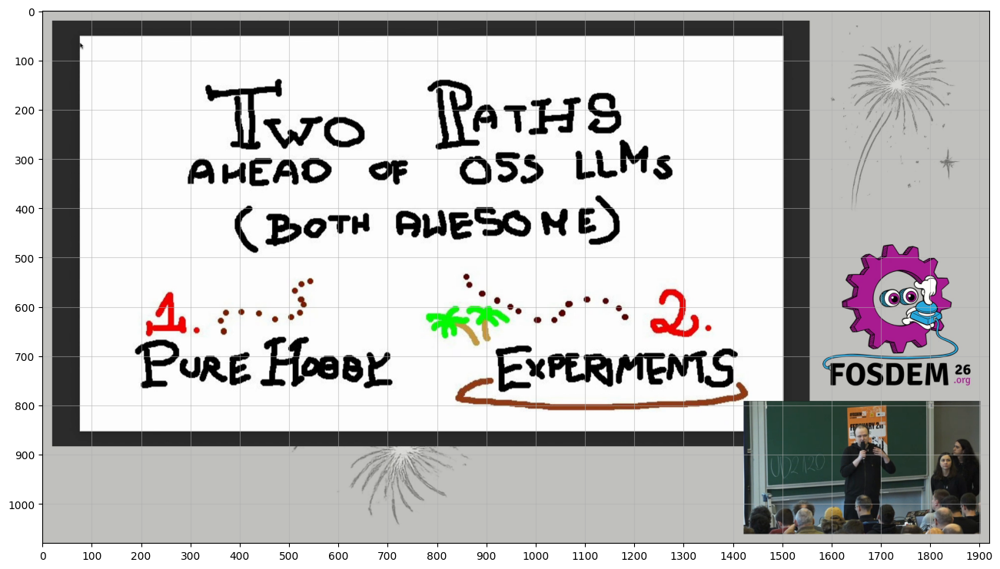

In [ ]:
import matplotlib.pyplot as plt

frame = one_talk.select(f=talks.video.extract_frame(timestamp=90)).collect()[0]["f"]
plt.figure(figsize=(16, 9))
plt.imshow(frame)
plt.xticks(range(0, 1921, 100)); plt.yticks(range(0, 1081, 100)); plt.grid(alpha=0.5)
plt.show()

In [ ]:
SLIDE_BOX = (75, 50, 1425, 800)   # x, y, width, height of the slide area, measured on PD8WGF (1920x1080)
x, y, w, h = SLIDE_BOX

t0 = time.time()
talks.add_computed_column(
    slide_proxy=talks.video.ffmpeg_filter(vf=f"crop={w}:{h}:{x}:{y},scale=640:-2,fps=2"),
    if_exists="ignore",
)
print(f"proxy built in {time.time() - t0:.0f}s")

Added 1 column value with 0 errors in 300.19 s (0.00 rows/s)
proxy built in 300s


In [ ]:
one_talk = talks.where(talks.talk_id == "PD8WGF")   # rebuild the query so it sees the new column

proxy_configs = {
    "content t=27":         talks.slide_proxy.scene_detect_content(min_scene_len=4),
    "content t=15 + edges": talks.slide_proxy.scene_detect_content(min_scene_len=4, threshold=15.0, delta_edges=1.0),
    "adaptive":             talks.slide_proxy.scene_detect_adaptive(min_scene_len=4, min_content_val=5.0),
    "hash t=0.25":          talks.slide_proxy.scene_detect_hash(min_scene_len=4, threshold=0.25),
}
proxy_results = {}
for name, expr in proxy_configs.items():
    t0 = time.time()
    proxy_results[name] = one_talk.select(s=expr).collect()[0]["s"]
    durs = [sc["duration"] for sc in proxy_results[name]]
    print(f"{name:22s} {len(durs):3d} scenes | median {statistics.median(durs):4.0f}s | "
          f"longest {max(durs):4.0f}s | took {time.time() - t0:3.0f}s")

content t=27            16 scenes | median   52s | longest  187s | took  14s
content t=15 + edges    24 scenes | median   48s | longest  101s | took  25s
adaptive                24 scenes | median   48s | longest  101s | took  11s
hash t=0.25             23 scenes | median   50s | longest  101s | took   9s


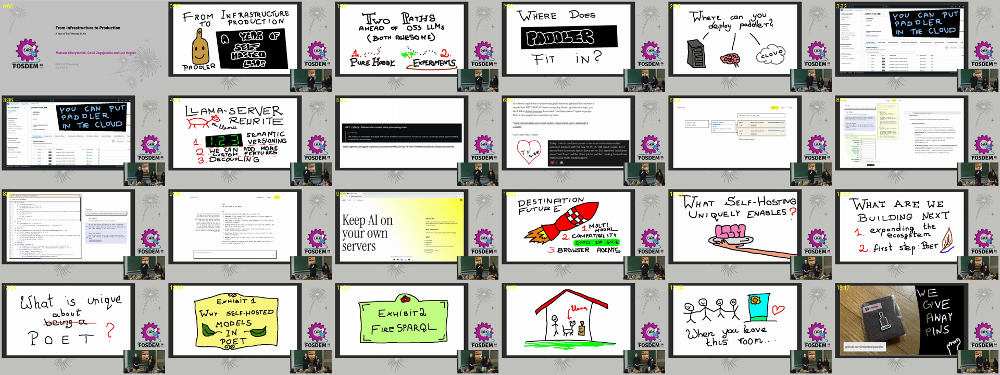

In [ ]:
contact_sheet(proxy_results["content t=15 + edges"])   # change to the most promising setting from Cell 19

In [23]:
from pixeltable.functions.json import list_iterator

talks.add_computed_column(
    scenes=talks.slide_proxy.scene_detect_content(min_scene_len=4, threshold=15.0, delta_edges=1.0),
    if_exists="ignore",
)
keyframes = pxt.create_view("mmrag.keyframes", talks, iterator=list_iterator(talks.scenes), if_exists="ignore")
keyframes.add_computed_column(
    slide=keyframes.video.extract_frame(timestamp=keyframes.start_time + keyframes.duration / 2)
                         .crop((x, y, x + w, y + h)),
    if_exists="ignore",
)
print(keyframes.count(), "keyframes")

Added 1 column value with 0 errors in 19.41 s (0.05 rows/s)
Created view 'mmrag/keyframes'.
Added 24 column values with 0 errors in 3.67 s (6.54 rows/s)
24 keyframes


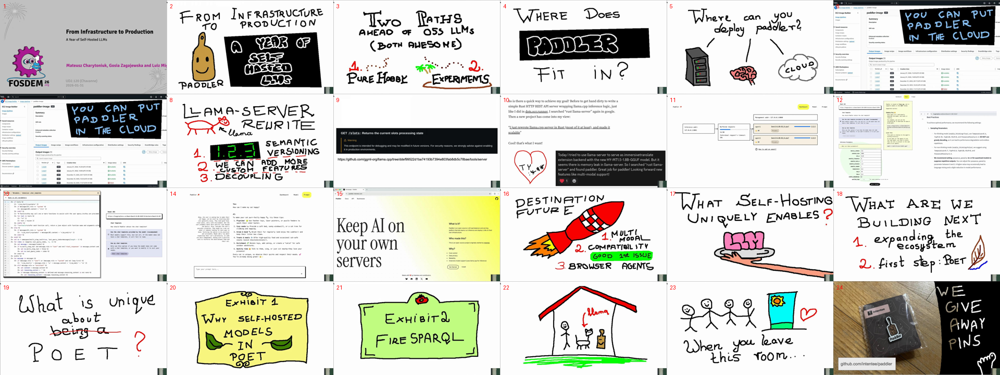

In [24]:
image_grid(keyframes.order_by(keyframes.start_time).select(keyframes.slide).collect()["slide"])

In [25]:
import json
from pixeltable.functions import openai

@pxt.udf
def parse_json(s: str) -> pxt.Json:
    return json.loads(s)

SLIDE_PROMPT = (
    "This image is one slide from a recorded tech talk. Reply with a JSON object with two keys. "
    '"text": the words visible on the slide, verbatim, including handwritten words, labels and names '
    "(for dense screenshots or code, give the title and the most prominent words, at most about 100 words). "
    '"description": 2-3 sentences on what the slide shows (drawings, diagrams, screenshots) and its main point.'
)

keyframes.add_computed_column(
    vlm=openai.chat_completions(
        messages=[{"role": "user", "content": [
            {"type": "text", "text": SLIDE_PROMPT},
            {"type": "image_url", "image_url": keyframes.slide},
        ]}],
        model="gpt-4o-mini",
        model_kwargs={"response_format": {"type": "json_object"}, "max_completion_tokens": 600},
    ),
    if_exists="ignore",
)
keyframes.add_computed_column(vlm_json=parse_json(keyframes.vlm.choices[0].message.content), if_exists="ignore")
keyframes.add_computed_column(slide_text=keyframes.vlm_json.text.astype(pxt.String), if_exists="ignore")
keyframes.add_computed_column(caption=keyframes.vlm_json.description.astype(pxt.String), if_exists="ignore")

Added 24 column values with 0 errors in 15.83 s (1.52 rows/s)
Added 24 column values with 0 errors in 0.03 s (809.60 rows/s)
Added 24 column values with 0 errors in 0.03 s (807.05 rows/s)
Added 24 column values with 0 errors in 0.03 s (834.41 rows/s)


24 rows updated.

In [26]:
u = keyframes.select(p=keyframes.vlm.usage.prompt_tokens, c=keyframes.vlm.usage.completion_tokens).collect().to_pandas()
cost = u.p.sum() * 0.15e-6 + u.c.sum() * 0.60e-6   # gpt-4o-mini list price per token, input / output
print(f"{len(u)} slides | {u.p.sum():,} input + {u.c.sum():,} output tokens | ${cost:.3f} total | ${cost / len(u):.4f} per slide")

24 slides | 886,344 input + 3,192 output tokens | $0.135 total | $0.0056 per slide


In [27]:
kf = (keyframes.order_by(keyframes.start_time)
      .select(keyframes.start_time, keyframes.slide_text, keyframes.caption).collect().to_pandas())
tr = chunks.where(chunks.talk_id == "PD8WGF").select(chunks.text).collect().to_pandas()

terms = {"Paddler": r"paddler", "FIRESPARQL": r"fire\s*sparql", "llama": r"llama", "Poet": r"\bpoet\b"}
for name, pattern in terms.items():
    print(f"{name:11s} on slides: {kf.slide_text.str.contains(pattern, case=False).sum():2d} | "
          f"in transcript chunks: {tr.text.str.contains(pattern, case=False).sum():2d}")

pd.set_option("display.max_colwidth", 160)
kf

Paddler     on slides:  9 | in transcript chunks:  3
FIRESPARQL  on slides:  1 | in transcript chunks:  0
llama       on slides:  5 | in transcript chunks:  4
Poet        on slides:  3 | in transcript chunks:  1


,start_time,slide_text,caption
0,0.0,"From Infrastructure to Production\nA Year of Self-Hosted LLMs\nMateusz Charytoniuk, Gosia Zagajewska and Luiz Mi\nUD2.120 (Chavanne)\n2026-01-31",The slide features the title of the talk revolving around the transition from infrastructure to production for self-hosted LLMs (Large Language Models). It ...
1,5.0,FROM\n INFR ASTRUCTURE\n PRODUCTION\n A YEAR OF\n SELF HOSTED\n LHS\n PADDLER,"The slide features a playful illustration of a paddle with a smiling face labeled 'PADDLER.' It contrasts the phrases 'FROM INFRASTRUCTURE' to 'PRODUCTION,'..."
2,72.0,Two Paths\nAHEAD OF OSS LLMs\n(Both Awesome)\n1. PURE HOBBY\n2. EXPERIMENTS,"The slide presents two distinct paths for open-source large language models (LLMs), emphasizing the theme of exploration and creativity. It features a simpl..."
3,148.0,WHERE DOES\nPADDLE\nFIT IN?,The slide features a bold graphic with the text 'WHERE DOES PADDLE FIT IN?' prominently displayed. The emphasis on the word 'PADDLE' is illustrated in a lar...
4,174.5,Where can you deploy paddler? | (drawing of a server) | (drawing of a brain) | (drawing of a cloud),"The slide consists of a simple sketch illustrating three different options for deploying 'paddler.' It includes a drawing of a server, a brain, and a cloud,..."
5,212.0,YOU CAN PUT PADDLER IN THE CLOUD,"The slide displays a user interface from AWS EC2 Image Builder, featuring sections for image pipelines, output images, and a summary of an image labeled as ..."
6,216.5,YOU CAN PUT PADDLER IN THE CLOUD,"The slide features a screenshot of the AWS EC2 Image Builder interface, showing details of an image pipeline named 'paddler-image'. Prominent elements inclu..."
7,264.5,LLAMA-SERVER REWRITE\n1. 1.2.3\n2. WE CAN ADD MORE CUSTOM FEATURES\n3. DECLOUPLING\nSEMANTIC VERSIONING,"The slide features a humorous illustration of a llama drawn in red, with the title 'LLAMA-SERVER REWRITE' prominently displayed. Below the title, there are ..."
8,359.0,GET /slots: Returns the current slots processing state\n⚠️ Warning\nThis endpoint is intended for debugging and may be modified in future versions. For secu...,The slide presents an API endpoint 'GET /slots' that retrieves the current processing state of slots. It includes a warning indicating the endpoint's intent...
9,385.5,"So is there a quick way to achieve my goal? Before to get hand dirty to write a simple Rust HTTP REST API server wrapping llama.cpp inference logic, just li...",The slide discusses the author's exploration of using a Rust HTTP REST API server to interact with llama.cpp inference logic. It highlights a newly discover...


In [28]:
import re

# Terms a user might search for, read off the slides (keyframe row -> terms). Verify against the PDF!
KEY_TERMS = {
    0:  ["From Infrastructure to Production", "Self-Hosted LLMs"],
    1:  ["Infrastructure", "Production", "Self Hosted", "LLMs", "Paddler"],
    2:  ["Two Paths", "OSS LLMs", "Pure Hobby", "Experiments"],
    3:  ["Where does", "Paddler", "Fit in"],
    4:  ["deploy paddler", "cloud"],
    5:  ["Paddler in the cloud"],
    7:  ["llama-server rewrite", "semantic versioning", "custom features", "decoupling"],
    8:  ["GET /slots"],
    14: ["Keep AI on your own servers"],
    15: ["Destination Future", "Multi modal", "Compatibility", "Browser agents"],
    16: ["Self-Hosting Uniquely Enables", "LLM"],
    17: ["Building next", "expanding the ecosystem", "Poet"],
    18: ["unique", "Poet"],
    19: ["Exhibit 1", "self-hosted models", "Poet"],
    20: ["Exhibit 2", "FIRE SPARQL"],
    21: ["llama"],
    22: ["When you leave this room"],
    23: ["give away pins", "github.com/intentee/paddler"],
}

def norm(s):
    return re.sub(r"[^a-z0-9]", "", (s or "").lower())

def term_recall(texts):
    hits, missed = 0, []
    for row, terms in KEY_TERMS.items():
        for term in terms:
            if norm(term) in norm(texts[row]):
                hits += 1
            else:
                missed.append((row, term))
    return hits / (hits + len(missed)), missed

n_terms = sum(len(v) for v in KEY_TERMS.values())
vlm_recall, vlm_missed = term_recall(kf.slide_text.tolist())
print(f"VLM key-term recall: {vlm_recall:.0%} of {n_terms} terms\nmissed: {vlm_missed}")

VLM key-term recall: 93% of 43 terms
missed: [(1, 'LLMs'), (3, 'Paddler'), (7, 'decoupling')]


In [29]:
!pip install -q easyocr
import numpy as np

_reader = None

@pxt.udf
def easyocr_text(img: pxt.Image) -> str:
    global _reader
    if _reader is None:
        import easyocr
        _reader = easyocr.Reader(["en"], gpu=True)
    return "\n".join(_reader.readtext(np.array(img.convert("RGB")), detail=0, paragraph=True))

t0 = time.time()
ocr = keyframes.order_by(keyframes.start_time).select(t=easyocr_text(keyframes.slide)).collect()["t"]
ocr_recall, ocr_missed = term_recall(ocr)
print(f"EasyOCR key-term recall: {ocr_recall:.0%} of {n_terms} terms | {time.time() - t0:.0f}s for {len(ocr)} slides")
print(f"missed: {ocr_missed}")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 33.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 183.4/183.4 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 972.1/972.1 kB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.7/295.7 kB 18.2 MB/s eta 0:00:00


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% CompleteEasyOCR key-term recall: 30% of 43 terms | 29s for 24 slides
missed: [(1, 'Production'), (1, 'Self Hosted'), (1, 'LLMs'), (2, 'Two Paths'), (2, 'Pure Hobby'), (2, 'Experiments'), (3, 'Where does'), (3, 'Paddler'), (3, 'Fit in'), (4, 'deploy paddler'), (5, 'Paddler in the cloud'), (7, 'llama-server rewrite'), (7, 'semantic versioning'), (7, 'custom features'), (7, 'decoupling'), (15, 'Compatibility'), (15, 'Browser agents'), (16, 'Self-Hosting Uniquely Enables'), (16, 'LLM'), (17, 'expanding the ecosystem'), (17, 'Poet'), (18, 'unique'), (18, 'Poet'), (19, 'Exhibit 1'), (19, 'self-hosted models'), (19, 'Poet'), (20, 'Exhibit 2'), (21, 'llama'), (22, 'When you leave this room'), (23, 'github.com/intentee/paddler')]


In [30]:
!pip install -q ultralytics
from ultralytics import YOLO

yolo = YOLO("yolo26n.pt")
imgs = keyframes.order_by(keyframes.start_time).select(keyframes.slide).collect()["slide"]
for i, img in enumerate(imgs):
    r = yolo.predict(img, conf=0.4, verbose=False)[0]
    print(i, sorted({r.names[int(c)] for c in r.boxes.cls}) or "-")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.7/46.7 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 52.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.0/90.0 kB 9.3 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
0 -
1 -
2 -
3 -
4 -
5 ['laptop']
6 ['laptop']
7 -
8 -
9 -
10 -
11 ['book']
12 ['laptop']
13 -
14 -
15 ['kite']
16 -
17 -
18 -
19 -
20 -
21 -
22 -
23 -


In [31]:
def download(talk_id):
    row = data.set_index("id").loc[talk_id]
    paths = []
    for url, ext in [(row.video_url, "mp4"), (row.slides_url, "pdf")]:
        dest = DATA / f"{talk_id}.{ext}"
        if not dest.exists():
            tmp = dest.with_suffix(".part")
            urllib.request.urlretrieve(url, tmp)
            tmp.replace(dest)
        paths.append(dest)
    return row, *paths

talk2, video2, slides2 = download("NHNPMY")

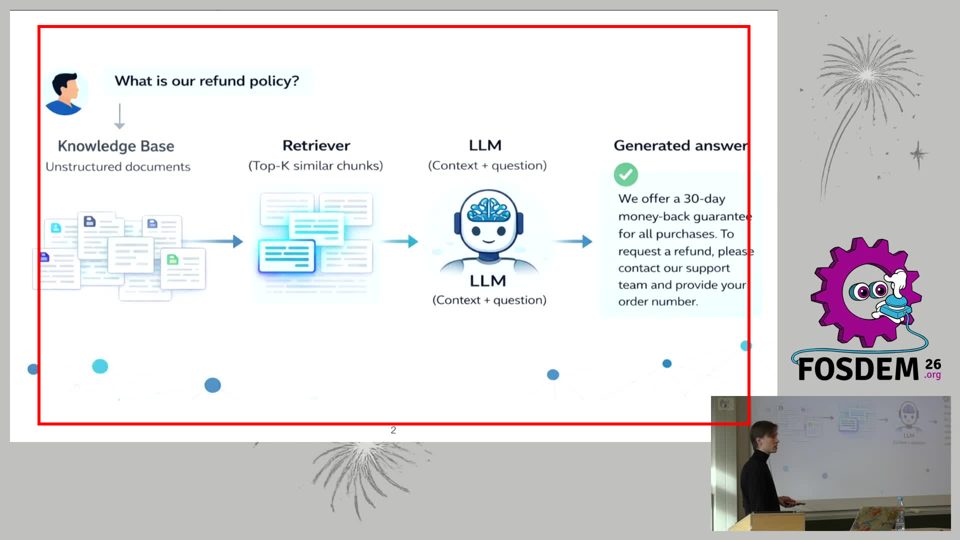

In [32]:
import subprocess

def check_box(video_path, t=120):
    probe = DATA / "probe.jpg"
    subprocess.run(["ffmpeg", "-y", "-loglevel", "error", "-ss", str(t), "-i", str(video_path),
                    "-frames:v", "1", str(probe)], check=True)
    img = Image.open(probe)
    ImageDraw.Draw(img).rectangle((x, y, x + w, y + h), outline="red", width=6)
    img.thumbnail((960, 540))
    return img

check_box(video2)

In [33]:
t0 = time.time()
if talks.where(talks.talk_id == "NHNPMY").count() == 0:
    talks.insert([{"talk_id": "NHNPMY", "title": talk2["title"], "video": str(video2)}])
print(f"talk 2 fully processed in {time.time() - t0:.0f}s")

Inserted 77 rows with 0 errors in 554.78 s (0.14 rows/s)
talk 2 fully processed in 555s


In [34]:
T2 = "NHNPMY"
c2 = chunks.where(chunks.talk_id == T2).select(chunks.segment_start, chunks.segment_end).collect().to_pandas()
k2 = keyframes.where(keyframes.talk_id == T2)
u2 = k2.select(p=keyframes.vlm.usage.prompt_tokens, c=keyframes.vlm.usage.completion_tokens).collect().to_pandas()
pdf2 = pdfium.PdfDocument(str(slides2))
print(f"{len(c2)} audio chunks ({(c2.segment_end - c2.segment_start).mean():.1f}s mean) | "
      f"{len(pdf2)} PDF slides | {k2.count()} keyframes | caption cost ${u2.p.sum() * 0.15e-6 + u2.c.sum() * 0.60e-6:.3f}")

52 audio chunks (26.1s mean) | 20 PDF slides | 24 keyframes | caption cost $0.136


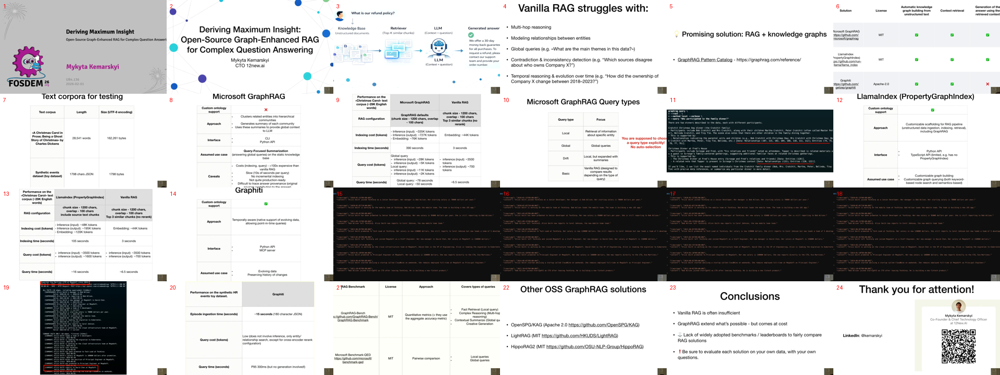

In [35]:
image_grid(k2.order_by(keyframes.start_time).select(keyframes.slide).collect()["slide"])

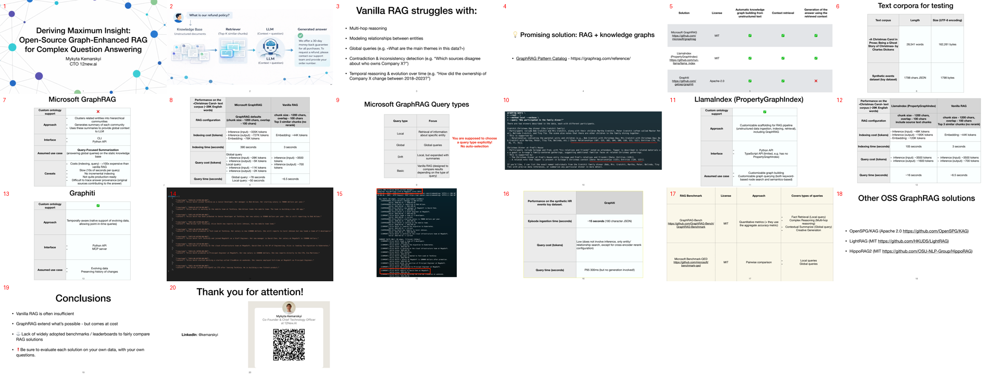

In [36]:
image_grid([pdf2[i].render(scale=0.5).to_pil() for i in range(len(pdf2))])